# Joint analysis of single-cell and spatial data

In [1]:
%env PYTORCH_ENABLE_MPS_FALLBACK=1

env: PYTORCH_ENABLE_MPS_FALLBACK=1


In [2]:
import numpy as np
import pynndescent
import torch
import torch.nn as nn
import pandas as pd

import matplotlib.pyplot as plt
from plotnine import *

from smoother import SpatialWeightMatrix, SpatialLoss, ContrastiveSpatialLoss
from smoother.models.reduction import SpatialVAE, SpatialANVI

import scvi
from scvi.hub import HubModel
import scanpy as sc
import anndata

In [3]:
DATA_DIR = "/Users/jysumac/Projects/Smoother_paper/data/prostate_ref_mapping/"
RES_DIR = "/Users/jysumac/Projects/Smoother_paper/results/prostate_ref_mapping/"

## Pretrained Tabula sapiens prostate-scvi model

### Download the model

* The tabula-sapiens-prostate-scvi/scanvi models seem to be trained on pancreatic cells. Not sure if this is intentional, but the pretrained model indeed separates different prostate cell types pretty well. For consistency we will use this model for all following analyses.
* Need to manually remove the "training_data_url" attribute to avoid URL validation trouble (stop downloading training data) https://huggingface.co/scvi-tools/tabula-sapiens-prostate-scvi/blob/main/_scvi_required_metadata.json
* The training prostate reference data were manually downloaded from https://zenodo.org/api/files/fd2c61e6-f4cd-4984-ade0-24d26d9adef6/TS_Prostate_filtered.h5ad
* Also to load this model pandas has to be downgraded to <2.0

In [4]:
tsp_scvi = HubModel.pull_from_huggingface_hub(
    repo_name="scvi-tools/tabula-sapiens-prostate-scvi",
    cache_dir=f"{DATA_DIR}/tabula-sapiens-prostate-scvi",
    revision="main",
)
#scref = tsp_scvi.adata
model_ref = tsp_scvi.model

Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

INFO     Loading model...                                                                                          
INFO     File                                                                                                      
         /Users/jysumac/Projects/Smoother_paper/data/prostate_ref_mapping//tabula-sapiens-prostate-scvi/models--scv
         i-tools--tabula-sapiens-prostate-scvi/snapshots/1c23ccae7c016206a9422cbd2d30e5231adbdf0e/model.pt already 
         downloaded                                                                                                


/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.


In [5]:
# load the prostate sc reference data
#  https://zenodo.org/api/files/fd2c61e6-f4cd-4984-ade0-24d26d9adef6/TS_Prostate_filtered.h5ad
ref_dir = f"{DATA_DIR}/tabula-sapiens-prostate-scvi/TS_Prostate_filtered.h5ad"
scref = anndata.read_h5ad(ref_dir)
scref.obsm["X_umap_orig"] = scref.obsm['X_umap'].copy()

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.


In [6]:
scvi.model.SCVI.prepare_query_anndata(scref, model_ref)

INFO     Found 100.0% reference vars in query data.                                                                


#### (Optional) Re-train the reference model on prostate scRNA-seq data

Re-train the model on scRNA-seq data did not help with reducing the batch effect of the spatial Slide-seqV2 data. So we proceed with the original hub model.

In [ ]:
# model_ref = scvi.model.SCVI.load_query_data(
#     scref,
#     model_ref,
#     unfrozen=True,
# )
# model_ref.train(max_epochs=100, accelerator='cpu')

#### Continue with the new prostate scRNA-seq data

In [7]:
model_ref = scvi.model.SCVI.load_query_data(
    scref,
    model_ref,
    unfrozen=True,
)
model_ref.is_trained_ = True

#### UMAP visualization

In [8]:
scref.obsm['X_scvi'] = model_ref.get_latent_representation()
sc.pp.neighbors(scref, use_rep="X_scvi")
sc.tl.umap(scref)
scref.obsm["X_umap_scvi"] = scref.obsm['X_umap'].copy()

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/umap/distances.py:1086: 

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


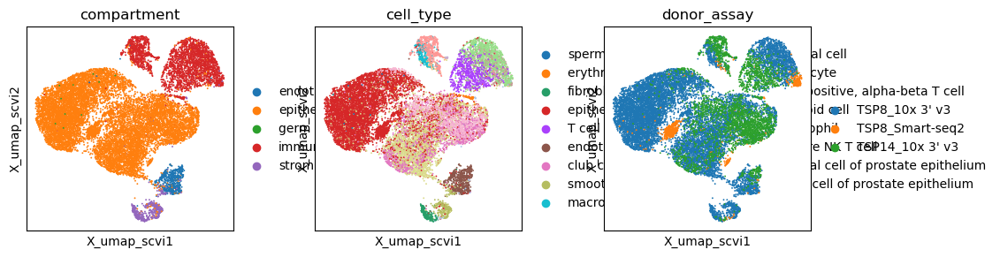

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


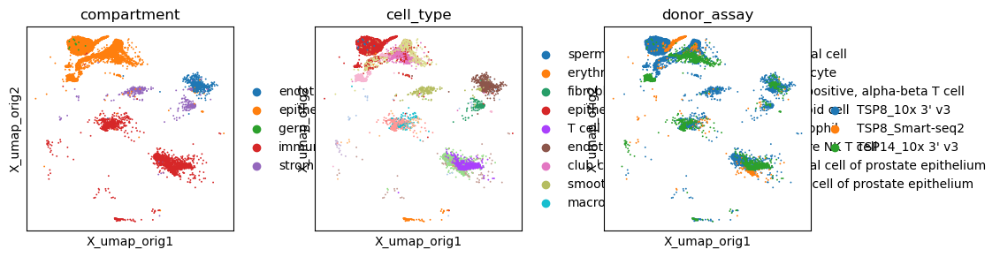

In [9]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.embedding(
        scref, basis='X_umap_scvi', 
        color=['compartment', 'cell_type', 'donor_assay']
    ),
    sc.pl.embedding(
        scref, basis='X_umap_orig', 
        color=['compartment', 'cell_type', 'donor_assay']
    )

### Load ST data (healthy patient HP1)

In [10]:
st = sc.read_h5ad(f"{DATA_DIR}/ST_HP1.h5ad")
st.layers['raw'] = st.X.copy()
st.obsm['spatial'] = st.obs[['xcoord', 'ycoord']].values
st.obs['donor_assay'] = st.obs['batch']
st.obs['cell_ontology_class'] = "unlabeled"

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


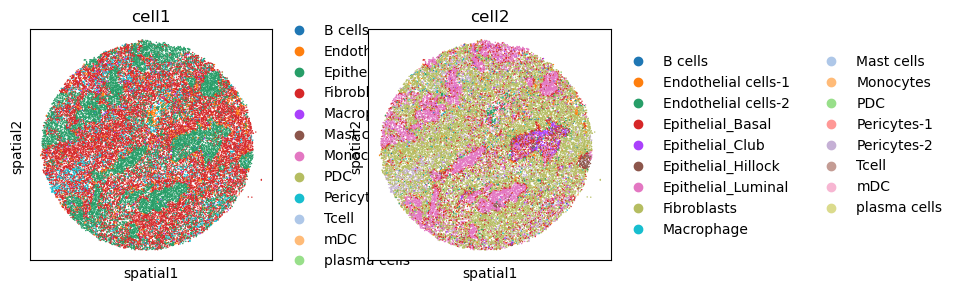

In [11]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.embedding(
        st, basis='spatial', 
        color=['cell1', 'cell2']
    )

### RNA-only Finetuning

Need to set 'unfrozen=True' to fit the ST data as much as possible. Otherwise the encoder will fail to capture structures in the new data and the batch effect will be even stronger.

#### Training

In [12]:
st_rna = scvi.model.SCVI.prepare_query_anndata(st, model_ref, inplace=False)

INFO     Found 91.425% reference vars in query data.                                                               


/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


In [13]:
model_q = scvi.model.SCVI.load_query_data(
    st_rna,
    model_ref,
    unfrozen=True,
)

In [14]:
model_q.train(max_epochs=100, accelerator='cpu', plan_kwargs=dict(weight_decay=0.0))

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.


Epoch 100/100: 100%|█| 100/100 [14:30<00:00,  8.66s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|█| 100/100 [14:30<00:00,  8.71s/it, v_num=1, train_loss_step


In [15]:
dir_path = f"{RES_DIR}/scvi_st_finetuned_unfrozen/"
model_q.save(dir_path, overwrite=True)

#### Reload the fine-tuned model

In [16]:
dir_path = f"{RES_DIR}/scvi_st_finetuned_unfrozen/"
model_q = scvi.model.SCVI.load(dir_path, st_rna)

INFO     File                                                                                                      
         /Users/jysumac/Projects/Smoother_paper/results/prostate_ref_mapping//scvi_st_finetuned_unfrozen/model.pt  
         already downloaded                                                                                        


#### UMAP visualization

In [17]:
st.obsm["X_scvi"] = model_q.get_latent_representation()
sc.pp.neighbors(st, use_rep="X_scvi")
sc.tl.leiden(st, key_added='leiden_scvi')
sc.tl.umap(st)
st.obsm["X_umap_scvi"] = st.obsm['X_umap'].copy()

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


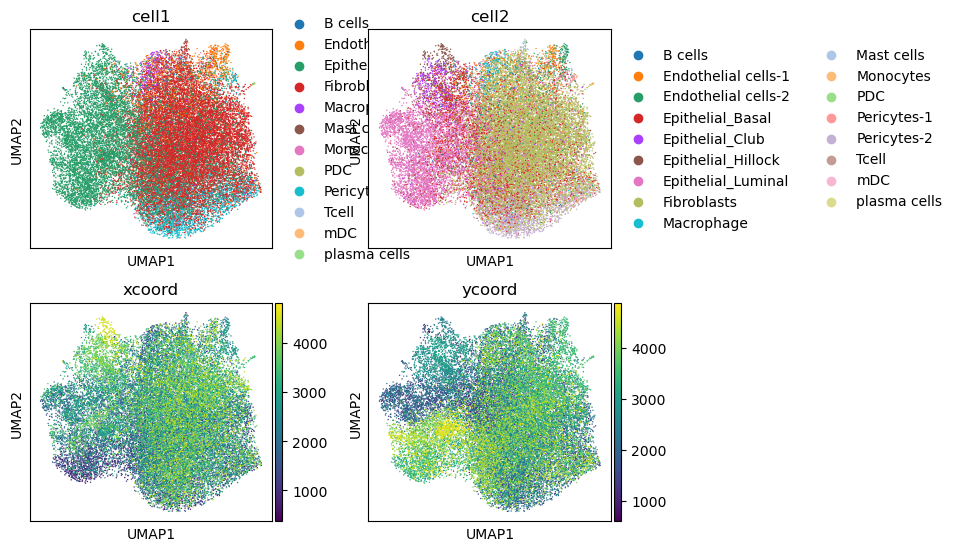

In [18]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(st, color = ['cell1', 'cell2', 'xcoord', 'ycoord'], ncols=2)

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


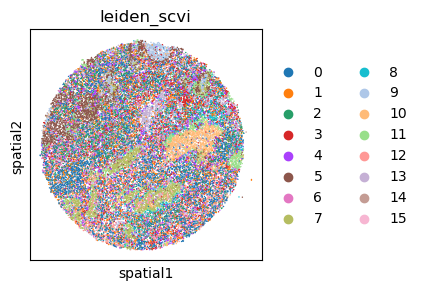

In [19]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.embedding(st, basis='spatial', color = ['leiden_scvi'])

### SpatialVAE

#### Preprocess ST data

In [20]:
st_sp = st.copy()

sc.pp.normalize_total(st_sp, target_sum=1e4)
sc.pp.log1p(st_sp)
st_sp.layers['log1p'] = st_sp.X.copy()
sc.pp.highly_variable_genes(
    st_sp, subset=False, n_top_genes=2000, layer="log1p"
)

# remember to switch to the raw counts data
st_sp.X = st_sp.layers['raw']

#### Calculate spatial losses

In [21]:
y = st_sp.layers['log1p'][:, st_sp.var['highly_variable']].toarray()
y = torch.tensor(y).T
coords = st_sp.obsm['spatial']

weights = SpatialWeightMatrix()
weights.calc_weights_knn(coords)
weights.scale_by_expr(y)

# prepare spatial loss
sp_loss = SpatialLoss('icar', weights, 0.99, standardize_cov=False)
cont_sp_loss = ContrastiveSpatialLoss('icar', weights, 0.99, standardize_cov=False)

Number of spots: 29278. Average number of neighbors per spot:  5.13.
Number of spots: 29278. Average number of neighbors per spot:  5.14.


#### Transfer from the RNA-only SCVI model and train

Again, unfroze the model to allow parameter adaptation under the spatial loss.

In [22]:
# this step can be skipped since 
# SpatialVAE.from_rna_model will automatically prepare the query adata
st_sp = scvi.model.SCVI.prepare_query_anndata(st_sp, model_q, inplace=False)

INFO     Found 91.425% reference vars in query data.                                                               


/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


In [23]:
model_sp = SpatialVAE.from_rna_model(
    st_sp, model_q, spatial_loss=sp_loss, lambda_spatial_loss=0.01,
    unfrozen=True,
)

INFO     Found 100.0% reference vars in query data.                                                                


In [24]:
model_sp.train(max_epochs=100, accelerator='cpu', plan_kwargs=dict(weight_decay=0.0))

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:280: PossibleUserWarning: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 100/100: 100%|█| 100/100 [10:24<00:00,  6.17s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|█| 100/100 [10:24<00:00,  6.24s/it, v_num=1, train_loss_step


In [25]:
dir_path = f"{RES_DIR}/spvae_st_finetuned_unfrozen/"
model_sp.save(dir_path, overwrite=True)

#### Reload SpatialVAE model

In [26]:
dir_path = dir_path = f"{RES_DIR}/spvae_st_finetuned_unfrozen/"
model_sp = SpatialVAE.load(dir_path, st_sp)

INFO     File                                                                                                      
         /Users/jysumac/Projects/Smoother_paper/results/prostate_ref_mapping//spvae_st_finetuned_unfrozen/model.pt 
         already downloaded                                                                                        


#### UMAP visualization

In [27]:
st.obsm['X_spvae'] = model_sp.get_latent_representation()
sc.pp.neighbors(st, use_rep="X_spvae")
sc.tl.leiden(st, key_added='leiden_spvae', resolution=0.5)
sc.tl.umap(st)
st.obsm['X_umap_spvae'] = st.obsm['X_umap'].copy()

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


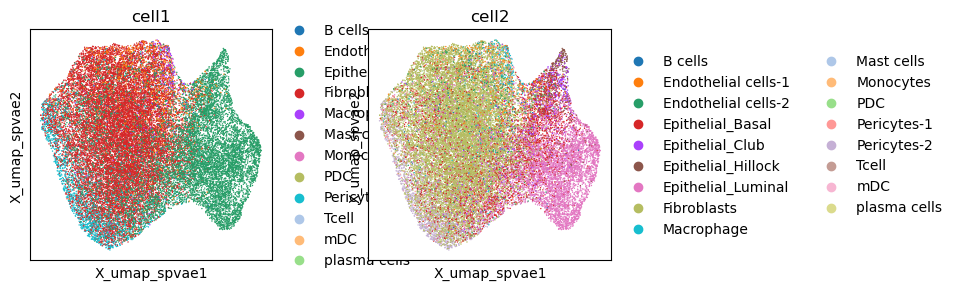

In [28]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.embedding(st, basis='X_umap_spvae', color=['cell1', 'cell2'])

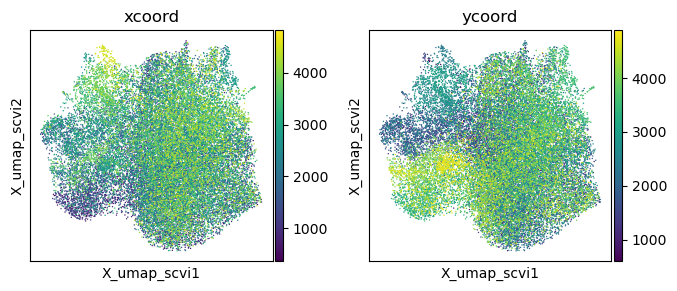

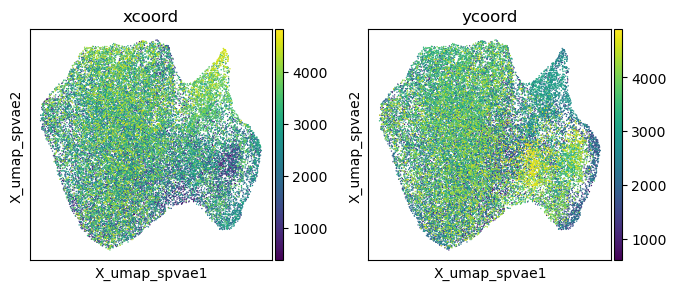

In [29]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.embedding(st, basis='X_umap_scvi', color=['xcoord', 'ycoord'])
    sc.pl.embedding(st, basis='X_umap_spvae', color=['xcoord', 'ycoord'])

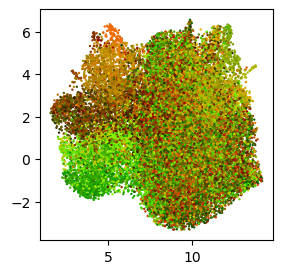

In [30]:
normalized_x = (st.obs['xcoord'] - st.obs['xcoord'].min()) / (st.obs['xcoord'].max() - st.obs['xcoord'].min())
normalized_y = (st.obs['ycoord'] - st.obs['ycoord'].min()) / (st.obs['ycoord'].max() - st.obs['ycoord'].min())
_df = pd.DataFrame(
    {'x':st.obsm['X_umap_scvi'][:,0],
     'y':st.obsm['X_umap_scvi'][:,1],
     'color': list(zip(normalized_x, normalized_y, [0] * st.shape[0])),
     #'color': list(zip(normalized_x, normalized_y, (normalized_x + normalized_y)/2))
    }
)

with plt.rc_context({"figure.figsize": (3, 3)}):
    plt.scatter(_df['x'], _df['y'], c=_df['color'], s = 0.5)
    plt.show()

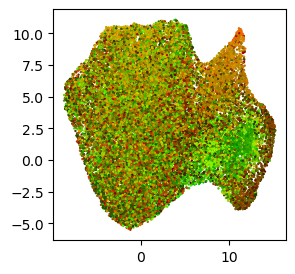

In [31]:
normalized_x = (st.obs['xcoord'] - st.obs['xcoord'].min()) / (st.obs['xcoord'].max() - st.obs['xcoord'].min())
normalized_y = (st.obs['ycoord'] - st.obs['ycoord'].min()) / (st.obs['ycoord'].max() - st.obs['ycoord'].min())
_df = pd.DataFrame(
    {'x':st.obsm['X_umap_spvae'][:,0],
     'y':st.obsm['X_umap_spvae'][:,1],
     'color': list(zip(normalized_x, normalized_y, [0] * st.shape[0])),
     #'color': list(zip(normalized_x, normalized_y, (normalized_x + normalized_y)/2))
    }
)

with plt.rc_context({"figure.figsize": (3, 3)}):
    plt.scatter(_df['x'], _df['y'], c=_df['color'], s = 0.5)
    plt.show()

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


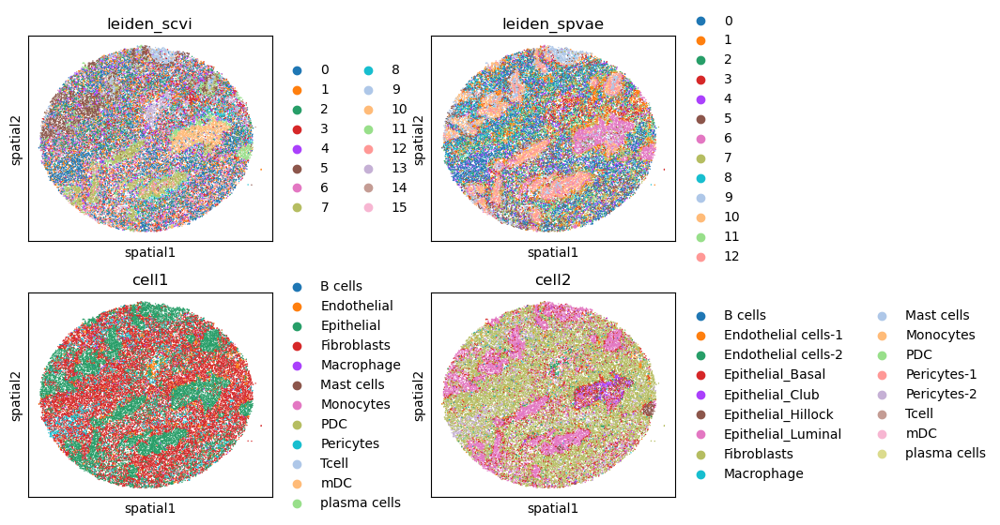

In [32]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.embedding(st, basis='spatial', color=['leiden_scvi', 'leiden_spvae','cell1', 'cell2'], ncols=2, wspace=0.5)

#### Spatial Loss diagnosis

In [33]:
# RNA-only fine-tuning
df_loss_q = pd.DataFrame(
    {k:model_q.history[k].values.squeeze().astype(float)
     for k in ['reconstruction_loss_train', 'kl_local_train', 'kl_global_train']}
)
df_loss_q.reset_index(inplace=True)

# spatial fine-tuning
df_loss_sp = pd.DataFrame(
    {k:model_sp.history[k].values.squeeze().astype(float)
     for k in ['reconstruction_loss_train', 'kl_local_train', 'kl_global_train']}
)
df_loss_sp.reset_index(inplace=True)
df_loss_sp['index'] += 100

# overall loss
df_loss = pd.concat([df_loss_q, df_loss_sp])
df_loss['phase'] = pd.Categorical(
    np.repeat(['RNA-only fine-tuning', 'Spatial fine-tuning'], 100),
    categories=['RNA-only fine-tuning', 'Spatial fine-tuning'],
    ordered=True
)

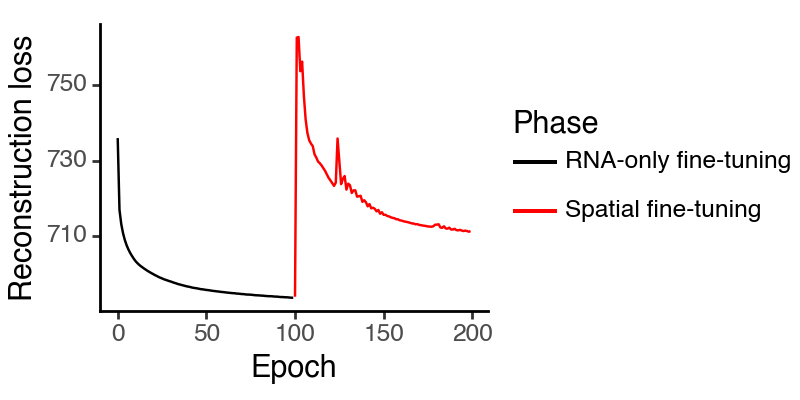

<Figure Size: (400 x 200)>

In [34]:
(
    ggplot(df_loss, aes(x = 'index', y = 'reconstruction_loss_train', color = 'phase')) +
        geom_line() + 
        labs(x = 'Epoch', y = 'Reconstruction loss', color = 'Phase') + 
        scale_color_manual(values={
            'RNA-only fine-tuning': 'black', 'Spatial fine-tuning': 'red'
        }) + 
        theme_classic() + 
        theme(figure_size=(4,2))
)

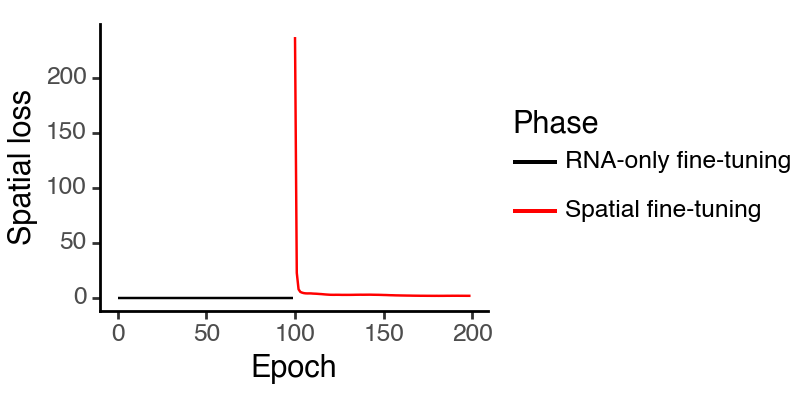

<Figure Size: (400 x 200)>

In [35]:
(
    ggplot(df_loss, aes(x = 'index', y = 'kl_global_train', color = 'phase')) +
        geom_line() + 
        labs(x = 'Epoch', y = 'Spatial loss', color = 'Phase') + 
        scale_color_manual(values={
            'RNA-only fine-tuning': 'black', 'Spatial fine-tuning': 'red'
        }) + 
        theme_classic() + 
        theme(figure_size=(4,2))
)

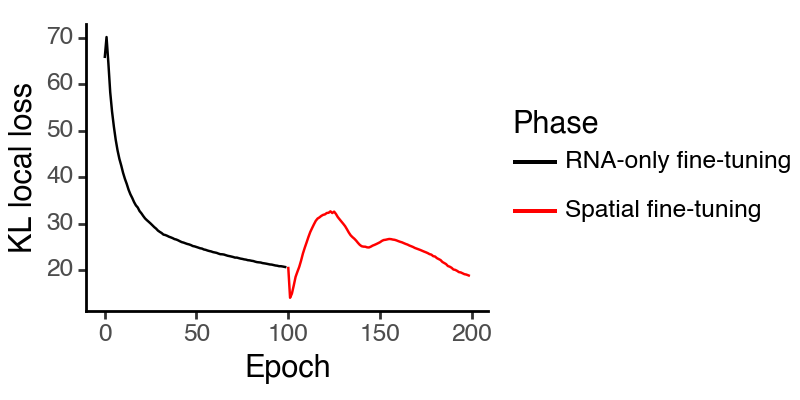

<Figure Size: (400 x 200)>

In [36]:
(
    ggplot(df_loss, aes(x = 'index', y = 'kl_local_train', color = 'phase')) +
        geom_line() + 
        labs(x = 'Epoch', y = 'KL local loss', color = 'Phase') + 
        scale_color_manual(values={
            'RNA-only fine-tuning': 'black', 'Spatial fine-tuning': 'red'
        }) + 
        theme_classic() + 
        theme(figure_size=(4,2))
)

In [37]:
sp_loss(torch.tensor(st.obsm['X_scvi'].T)), sp_loss(torch.tensor(st.obsm['X_spvae'].T))

(tensor(0.7577), tensor(0.0041))

### Joint embeddings

#### RNA-only model

In [38]:
adata_full = st_rna.concatenate(scref, batch_key='tech', batch_categories=['ST', 'SC'])

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


In [39]:
adata_full.obsm["X_scvi"] = model_q.get_latent_representation(adata_full)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


#### SpatialVAE model

In [40]:
adata_full_sp = st_sp.concatenate(scref, batch_key='tech', batch_categories=['ST', 'SC'])

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


In [41]:
adata_full.obsm["X_spvae"] = model_sp.get_latent_representation(adata_full_sp)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


#### UMAP

In [42]:
sc.pp.neighbors(adata_full, use_rep="X_scvi")
sc.tl.leiden(adata_full, key_added = 'leiden_scvi')
sc.tl.umap(adata_full)
adata_full.obsm['X_umap_scvi'] = adata_full.obsm['X_umap'].copy()

In [43]:
sc.pp.neighbors(adata_full, use_rep="X_spvae")
sc.tl.leiden(adata_full, key_added = 'leiden_spvae')
sc.tl.umap(adata_full)
adata_full.obsm['X_umap_spvae'] = adata_full.obsm['X_umap'].copy()

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


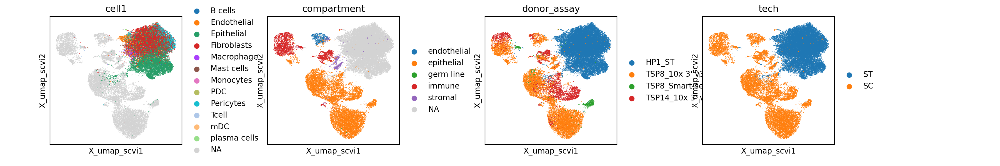

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


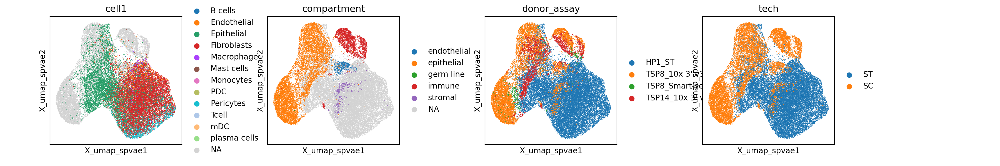

In [44]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.embedding(
        adata_full, basis='X_umap_scvi',
        color=['cell1', 'compartment', 'donor_assay', 'tech'], wspace=0.5
    )
    sc.pl.embedding(
        adata_full, basis='X_umap_spvae',
        color=['cell1', 'compartment', 'donor_assay', 'tech'], wspace=0.5
    )

In [45]:
sc.pp.calculate_qc_metrics(adata_full, inplace = True)

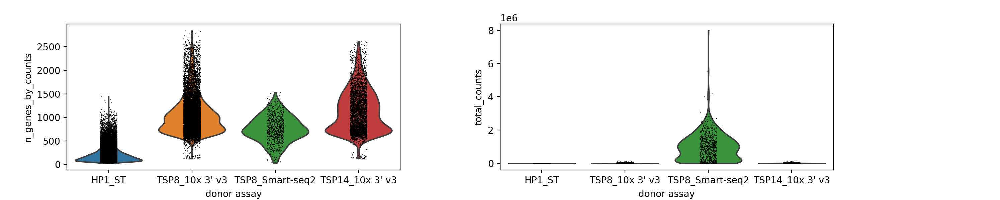

In [46]:
with plt.rc_context({"figure.figsize": (6, 3)}):
    sc.pl.violin(adata_full, ['n_genes_by_counts', 'total_counts'], groupby='donor_assay')

### Transfer annotation

In [47]:
scref.obs

,tissue_in_publication,donor_id,free_annotation,compartment,cell_type_ontology_term_id,cell_type,assay,sex,tissue,cell_ontology_class,cell_ontology_class_tissue,donor_tissue,assay_correct,donor_assay,_scvi_batch,_scvi_labels
cell_id,,,,,,,,,,,,,,,,
AAACCCACAATAGGAT_TSP8_Prostate_NA_10X_1_2,Prostate,TSP8,Basal Epithelial Cell,epithelial,CL:0002341,basal cell of prostate epithelium,10x 3' v3,male,prostate gland,basal cell of prostate epithelium,Prostate_basal cell of prostate epithelium,TSP8_Prostate,10x 3' v3,TSP8_10x 3' v3,5,15
AAACCCACACCTTCGT_TSP8_Prostate_NA_10X_1_2,Prostate,TSP8,Other Epithelial Cell,epithelial,CL:0000066,epithelial cell,10x 3' v3,male,prostate gland,epithelial cell,Prostate_epithelial cell,TSP8_Prostate,10x 3' v3,TSP8_10x 3' v3,5,17
AAACCCACAGCTGTTA_TSP8_Prostate_NA_10X_1_2,Prostate,TSP8,Basal Epithelial Cell,epithelial,CL:0002341,basal cell of prostate epithelium,10x 3' v3,male,prostate gland,basal cell of prostate epithelium,Prostate_basal cell of prostate epithelium,TSP8_Prostate,10x 3' v3,TSP8_10x 3' v3,5,15
AAACCCATCAGGAACG_TSP8_Prostate_NA_10X_1_2,Prostate,TSP8,Other Epithelial Cell,epithelial,CL:0000066,epithelial cell,10x 3' v3,male,prostate gland,epithelial cell,Prostate_epithelial cell,TSP8_Prostate,10x 3' v3,TSP8_10x 3' v3,5,17
AAACCCATCAGTCATG_TSP8_Prostate_NA_10X_1_2,Prostate,TSP8,Fibroblast,stromal,CL:0000057,fibroblast,10x 3' v3,male,prostate gland,fibroblast,Prostate_fibroblast,TSP8_Prostate,10x 3' v3,TSP8_10x 3' v3,5,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCAAACGGCA_TSP14_Prostate_NA_10X_1_2,Prostate,TSP14,Hillock Epithelial Cell,epithelial,CL:0000066,epithelial cell,10x 3' v3,male,prostate gland,epithelial cell,Prostate_epithelial cell,TSP14_Prostate,10x 3' v3,TSP14_10x 3' v3,4,17
TTTGGAGGTTCTCTCG_TSP14_Prostate_NA_10X_1_2,Prostate,TSP14,CPE High Luminal Epithelial Cell,epithelial,CL:0002340,luminal cell of prostate epithelium,10x 3' v3,male,prostate gland,luminal cell of prostate epithelium,Prostate_luminal cell of prostate epithelium,TSP14_Prostate,10x 3' v3,TSP14_10x 3' v3,4,19
TTTGGTTCAATAGTCC_TSP14_Prostate_NA_10X_1_2,Prostate,TSP14,Hillock Epithelial Cell,epithelial,CL:0000066,epithelial cell,10x 3' v3,male,prostate gland,epithelial cell,Prostate_epithelial cell,TSP14_Prostate,10x 3' v3,TSP14_10x 3' v3,4,17


In [48]:
def weighted_prediction(weights, ref_cats):
    """Get highest weight category."""
    N = len(weights)
    predictions = np.zeros((N,), dtype=ref_cats.dtype)
    uncertainty = np.zeros((N,))
    for i in range(N):
        obs_weights = weights[i]
        obs_cats = ref_cats[i]
        best_prob = 0
        for c in np.unique(obs_cats):
            cand_prob = np.sum(obs_weights[obs_cats == c])
            if cand_prob > best_prob:
                best_prob = cand_prob
                predictions[i] = c
                uncertainty[i] = max(1 - best_prob, 0)

    return predictions, uncertainty

#### RNA-only model

In [49]:
X_train = adata_full[adata_full.obs['tech'] == 'SC'].obsm['X_scvi']
ref_nn_index = pynndescent.NNDescent(X_train)
ref_nn_index.prepare()

query_data = adata_full[adata_full.obs['tech'] == 'ST'].obsm['X_scvi']
ref_neighbors, ref_distances = ref_nn_index.query(query_data)

In [50]:
# convert distances to affinities
stds = np.std(ref_distances, axis=1)
stds = (2.0 / stds) ** 2
stds = stds.reshape(-1, 1)
ref_distances_tilda = np.exp(-np.true_divide(ref_distances, stds))
weights = ref_distances_tilda / np.sum(ref_distances_tilda, axis=1, keepdims=True)

# for each annotation level, get prediction and uncertainty
label_keys = ['free_annotation', 'compartment', 'cell_type']
for l in label_keys:
    ref_cats = scref.obs[l].cat.codes.to_numpy()[ref_neighbors]
    p, u = weighted_prediction(weights, ref_cats)
    p = np.asarray(scref.obs[l].cat.categories)[p]
    st.obs[l + "_pred_scvi"], st.obs[l + "_uncertainty_scvi"] = p, u

In [51]:
uncertainty_threshold = 0.2
for l in label_keys:
    mask = st.obs[l + "_uncertainty_scvi"] > 0.2
    print(f"{l}: {sum(mask)/len(mask)} unknown")
    st.obs[l + "_pred_scvi"].loc[mask] = "Unknown"

free_annotation: 0.4599016326251793 unknown
compartment: 0.11944121866247695 unknown
cell_type: 0.3905321401735091 unknown


/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_34770/2621080163.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


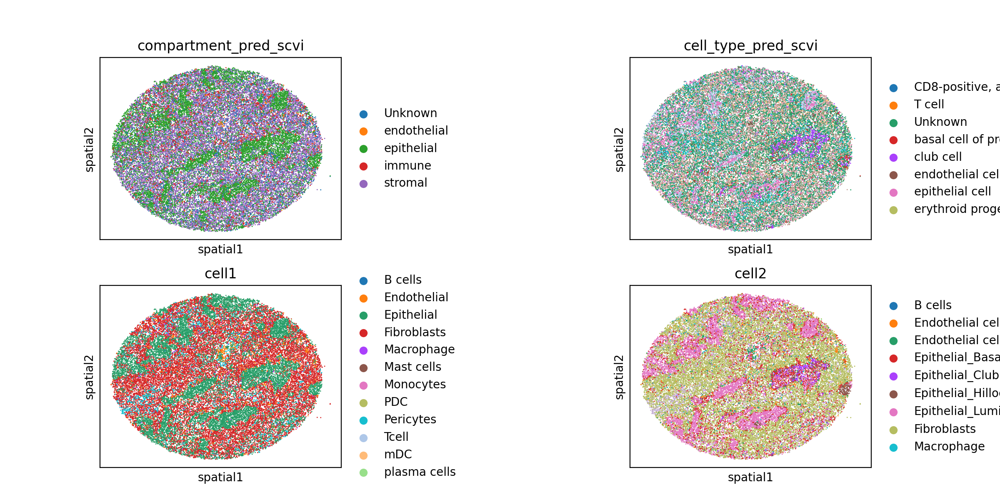

In [52]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.embedding(
        st, basis='spatial', 
        color=['compartment_pred_scvi', 'cell_type_pred_scvi', 'cell1', 'cell2'], 
        ncols=2, wspace=1)

#### SpatialVAE

In [53]:
X_train = adata_full[adata_full.obs['tech'] == 'SC'].obsm['X_spvae']
ref_nn_index = pynndescent.NNDescent(X_train)
ref_nn_index.prepare()

query_data = adata_full[adata_full.obs['tech'] == 'ST'].obsm['X_spvae']
ref_neighbors, ref_distances = ref_nn_index.query(query_data)

In [54]:
# convert distances to affinities
stds = np.std(ref_distances, axis=1)
stds = (2.0 / stds) ** 2
stds = stds.reshape(-1, 1)
ref_distances_tilda = np.exp(-np.true_divide(ref_distances, stds))
weights = ref_distances_tilda / np.sum(ref_distances_tilda, axis=1, keepdims=True)


# for each annotation level, get prediction and uncertainty
label_keys = ['free_annotation', 'compartment', 'cell_type']
for l in label_keys:
    ref_cats = scref.obs[l].cat.codes.to_numpy()[ref_neighbors]
    p, u = weighted_prediction(weights, ref_cats)
    p = np.asarray(scref.obs[l].cat.categories)[p]
    st.obs[l + "_pred_spvae"], st.obs[l + "_uncertainty_spvae"] = p, u

In [55]:
uncertainty_threshold = 0.2
for l in label_keys:
    mask = st.obs[l + "_uncertainty_spvae"] > 0.2
    print(f"{l}: {sum(mask)/len(mask)} unknown")
    st.obs[l + "_pred_spvae"].loc[mask] = "Unknown"

free_annotation: 0.40661930459730855 unknown
compartment: 0.09648883120431724 unknown
cell_type: 0.3893708586652094 unknown


/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_34770/4076492091.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


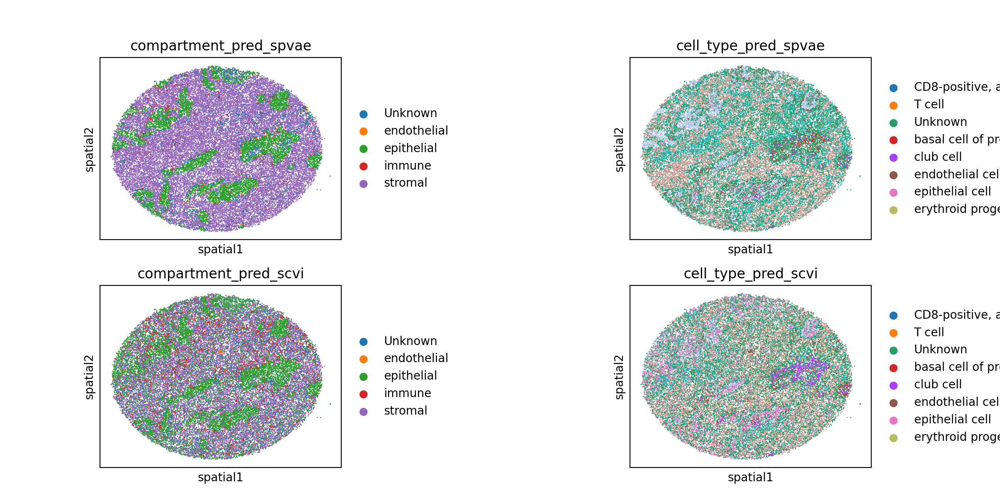

In [56]:
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.embedding(
        st, basis='spatial', 
        color=['compartment_pred_spvae', 'cell_type_pred_spvae',
               'compartment_pred_scvi', 'cell_type_pred_scvi'], 
        ncols=2, wspace=1)

## Figures

In [57]:
palette_comp = {
    'Endothelial': "#00A087",
    'Epithelial': "#E64B35",
    'Germ line': "#F39B7F",
    'Immune': "#3C5488",
    'Stromal': "#4DBBD5",
    #'Unknown': "lightgray"
    'Unknown': "#7E6148"
}
palette_assay = {
    "TSP8_10x 3' v3": '#2E7D32',
    "TSP14_10x 3' v3": '#E53935',
    "TSP8_Smart-seq2": '#FBC02D',
    "HP1_Slide-seqV2": '#1E88E5'
    
}

Light24 = [
    "#FD3216",
    "#00FE35",
    "#6A76FC",
    "#FED4C4",
    "#FE00CE",
    "#0DF9FF",
    "#F6F926",
    "#FF9616",
    "#479B55",
    "#EEA6FB",
    "#DC587D",
    "#D626FF",
    "#6E899C",
    "#00B5F7",
    "#B68E00",
    "#C9FBE5",
    "#FF0092",
    "#22FFA7",
    "#E3EE9E",
    "#86CE00",
    "#BC7196",
    "#7E7DCD",
    "#FC6955",
    "#E48F72",
]

cell_types = [
    "Smooth muscle cell",
    "Fibroblast",
    "Epithelium luminal cell",
    "Epithelial cell",
    "Epithelium basal cell",
    "Endothelial cell",
    "Club cell",
    "Macrophage",
    "Myeloid cell",
    "Monocyte",
    "CD8+, alpha-beta T cell",
    "Erythroid progenitor cell",
    "Mature NK T cell",
    "T cell",
    "Unknown",
]
palette_ct = {ct:Light24[i] for i, ct in enumerate(cell_types)}
palette_ct.update({'Unknown': 'lightgray'})

fig_res_dir = "/Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/"

#### Single-cell reference

In [58]:
df_scref = scref.obs.copy()
df_scref['x'] = scref.obsm['X_umap_scvi'][:,0]
df_scref['y'] = scref.obsm['X_umap_scvi'][:,1]
df_scref['compartment'] = df_scref['compartment'].str.capitalize()
df_scref['cell_type'] = df_scref['cell_type'].str.capitalize()
df_scref['cell_type'] = df_scref['cell_type'].str.replace(
    'Mature nk t cell', 'Mature NK T cell')
df_scref['cell_type'] = df_scref['cell_type'].str.replace(
    'Cd8-positive, alpha-beta t cell', 'CD8+, alpha-beta T cell ')
df_scref['cell_type'] = df_scref['cell_type'].str.replace(
    'Luminal cell of prostate epithelium', 'Epithelium luminal cell')
df_scref['cell_type'] = df_scref['cell_type'].str.replace(
    'Basal cell of prostate epithelium', 'Epithelium basal cell')

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3 x 2.5 in image.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/fig6b1.pdf


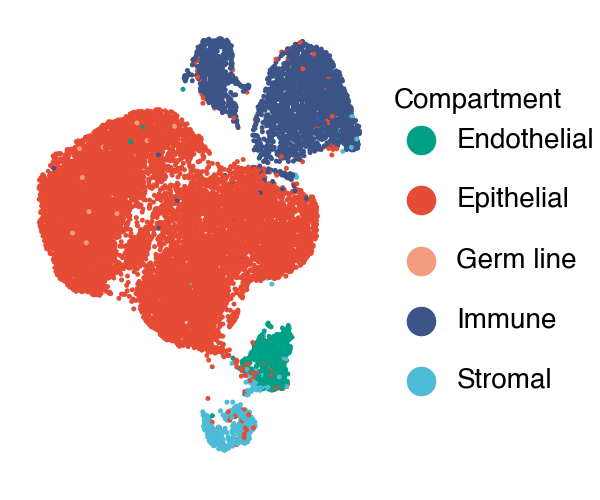

<Figure Size: (300 x 250)>

In [59]:
p = (
    ggplot(df_scref, aes(x='x',y='y',color='compartment')) + 
        geom_point(size = 0.01, alpha = 1) +
        labs(color = 'Compartment') + 
        theme_void() + 
        scale_color_manual(values = palette_comp) + 
        guides(color = guide_legend(
            override_aes = {'size':5, 'alpha':1}
        )) + 
        theme(
            figure_size=(3,2.5),
            legend_title=element_text(size = 10),
            legend_text=element_text(size = 10)
        )
)
p.save(fig_res_dir + 'fig6b1.pdf')
p

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3.5 x 2.5 in image.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/fig6b2.pdf


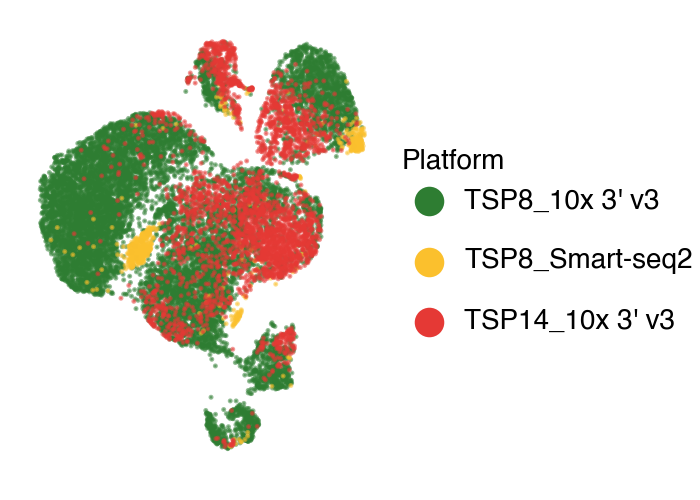

<Figure Size: (350 x 250)>

In [60]:
p = (
    ggplot(df_scref, aes(x='x',y='y',color='donor_assay')) + 
        geom_point(size = 0.01, alpha = 0.5) +
        labs(color = 'Platform') + 
        theme_void() + 
        scale_color_manual(values=palette_assay) + 
        guides(color = guide_legend(
            ncol=1,
            override_aes = {'size':5, 'alpha':1}
        )) + 
        theme(
            figure_size=(3.5,2.5),
            legend_title=element_text(size = 10),
            legend_text=element_text(size = 10)
        )
)
p.save(fig_res_dir + 'fig6b2.pdf')
p

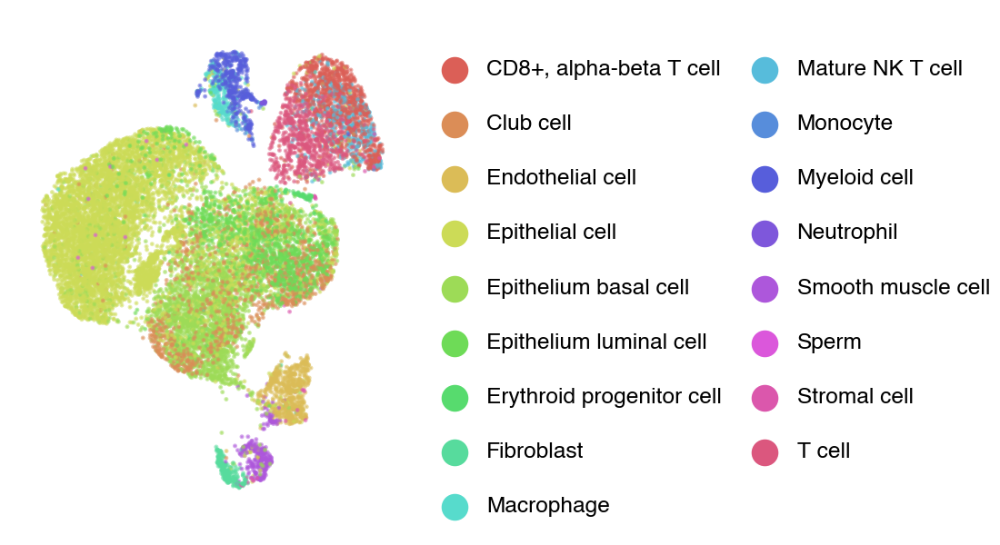

<Figure Size: (550 x 300)>

In [61]:
(
    ggplot(df_scref, aes(x='x',y='y',color='cell_type')) + 
        geom_point(size = 0.01, alpha = 0.5) +
        labs(color = '') + 
        theme_void() + 
        guides(color = guide_legend(
            ncol=2,
            override_aes = {'size':5, 'alpha':1}
        )) + 
        theme(figure_size=(5.5,3))
)

### Joint embeddings

In [62]:
df_joint = adata_full.obs.copy()
df_joint['x1'] = adata_full.obsm['X_umap_scvi'][:,0]
df_joint['y1'] = adata_full.obsm['X_umap_scvi'][:,1]
df_joint['x2'] = adata_full.obsm['X_umap_spvae'][:,0]
df_joint['y2'] = adata_full.obsm['X_umap_spvae'][:,1]
df_joint['donor_assay'] = df_joint['donor_assay'].str.replace('HP1_ST', 'HP1_Slide-seqV2')
df_joint['donor_assay'] = pd.Categorical(
    df_joint['donor_assay'], 
    categories=["TSP8_10x 3' v3", "TSP8_Smart-seq2", "TSP14_10x 3' v3", "HP1_Slide-seqV2"],
    ordered=True
)
df_joint['compartment'] = df_joint['compartment'].str.capitalize()

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3.5 x 2.5 in image.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/fig6c1.pdf


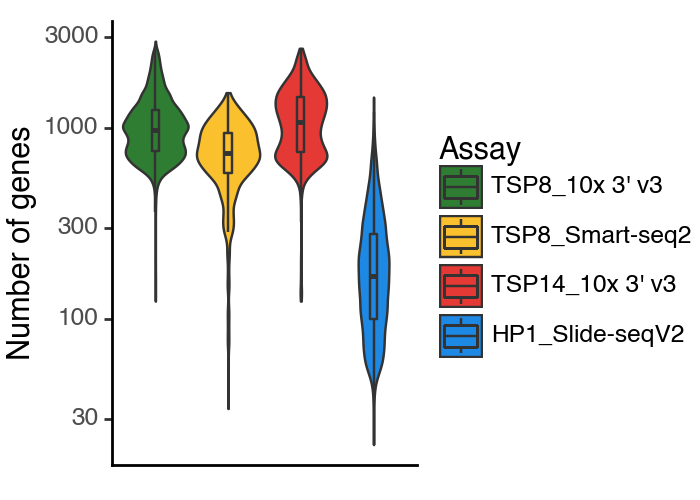

<Figure Size: (350 x 250)>

In [63]:
p = (
    ggplot(df_joint, aes(x='donor_assay', y='n_genes_by_counts', fill = 'donor_assay')) + 
        geom_violin() +
        geom_boxplot(width = 0.1, outlier_shape='none') + 
        labs(x='', y='Number of genes', fill = 'Assay')+
        theme_classic() + 
        scale_y_log10() +
        scale_fill_manual(values = palette_assay) + 
        theme(
            figure_size=(3.5,2.5),
            axis_text_x=element_blank(),
            axis_ticks_major_x=element_blank()
        )
)
p.save(fig_res_dir + 'fig6c1.pdf')
p

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3.5 x 2.5 in image.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/fig6c2.pdf


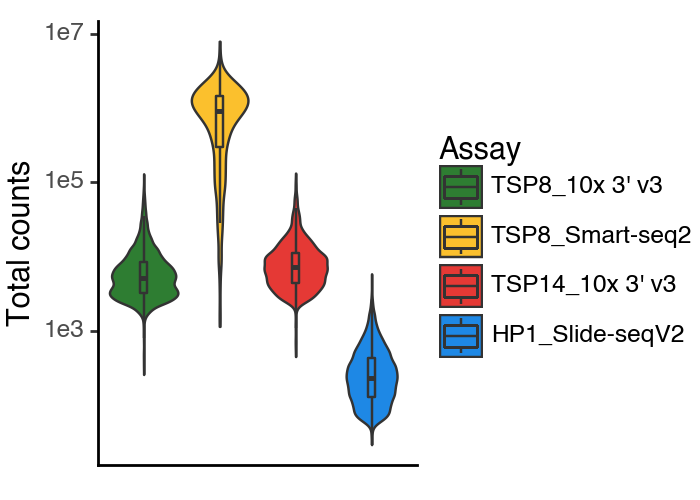

<Figure Size: (350 x 250)>

In [64]:
p = (
    ggplot(df_joint, aes(x='donor_assay', y='total_counts', fill = 'donor_assay')) + 
        geom_violin() +
        geom_boxplot(width = 0.1, outlier_shape='none') + 
        labs(x='', y='Total counts', fill = 'Assay')+
        scale_y_log10() + 
        scale_fill_manual(values = palette_assay) + 
        theme_classic() + 
        theme(
            figure_size=(3.5,2.5),
            axis_text_x=element_blank(),
            axis_ticks_major_x=element_blank()
        )
)
p.save(fig_res_dir + 'fig6c2.pdf')
p

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3.5 x 3 in image.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/fig6d1.pdf


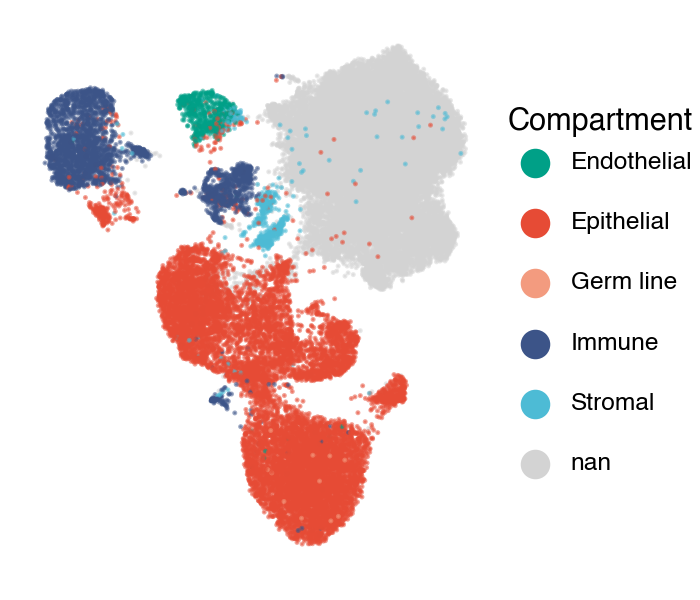

<Figure Size: (350 x 300)>

In [65]:
p = (
    ggplot(df_joint, aes(x='x1',y='y1',color='compartment')) + 
        geom_point(size = 0.01, alpha = 0.5) +
        labs(color = 'Compartment') + 
        theme_void() + 
        scale_color_manual(values=palette_comp, na_value='lightgray') + 
        guides(color = guide_legend(
            ncol=1,
            override_aes = {'size':5, 'alpha':1}
        )) + 
        theme(figure_size=(3.5,3))
)
p.save(fig_res_dir + 'fig6d1.pdf')
p

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 4 x 3 in image.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/fig6d2.pdf


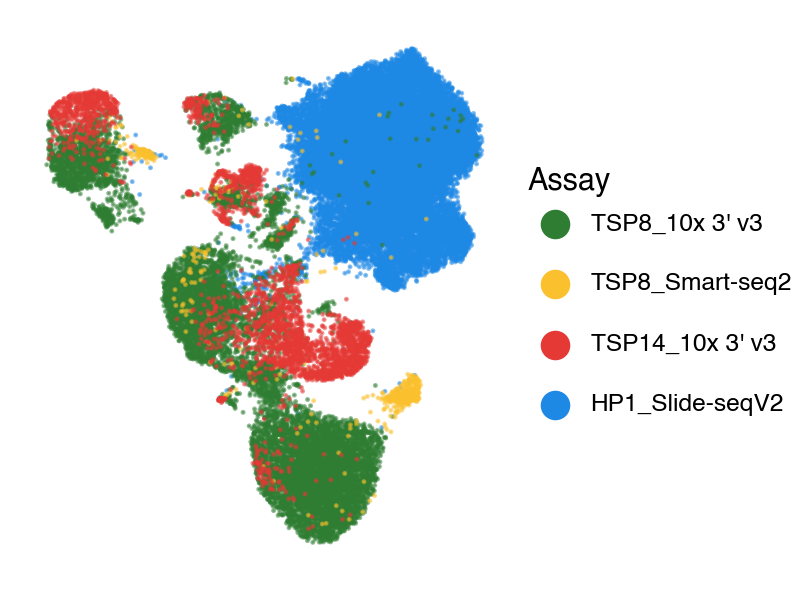

<Figure Size: (400 x 300)>

In [66]:
p = (
    ggplot(df_joint, aes(x='x1',y='y1',color='donor_assay')) + 
        geom_point(size = 0.01, alpha = 0.5) +
        labs(color = 'Assay') + 
        theme_void() + 
        scale_color_manual(values = palette_assay) + 
        guides(color = guide_legend(
            ncol=1,
            override_aes = {'size':5, 'alpha':1}
        )) + 
        theme(figure_size=(4,3))
)
p.save(fig_res_dir + 'fig6d2.pdf')
p

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3.5 x 3 in image.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/fig6f1.pdf


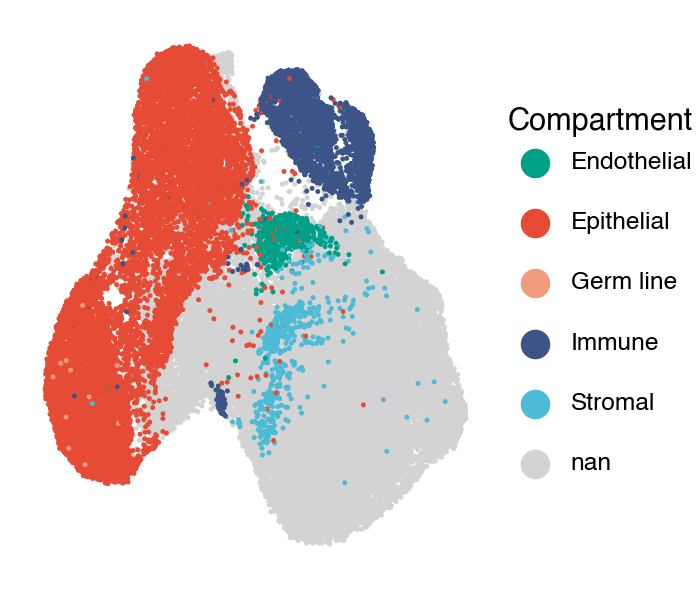

<Figure Size: (350 x 300)>

In [67]:
p = (
    ggplot(df_joint, aes(x='x2',y='y2',color='compartment')) + 
        geom_point(size = 0.01, alpha = 1) +
        labs(color = 'Compartment') + 
        theme_void() + 
        scale_color_manual(values=palette_comp, na_value='lightgray') + 
        guides(color = guide_legend(
            ncol=1,
            override_aes = {'size':5, 'alpha':1}
        )) + 
        theme(figure_size=(3.5,3))
)
p.save(fig_res_dir + 'fig6f1.pdf')
p

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 4 x 3 in image.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/fig6f2.pdf


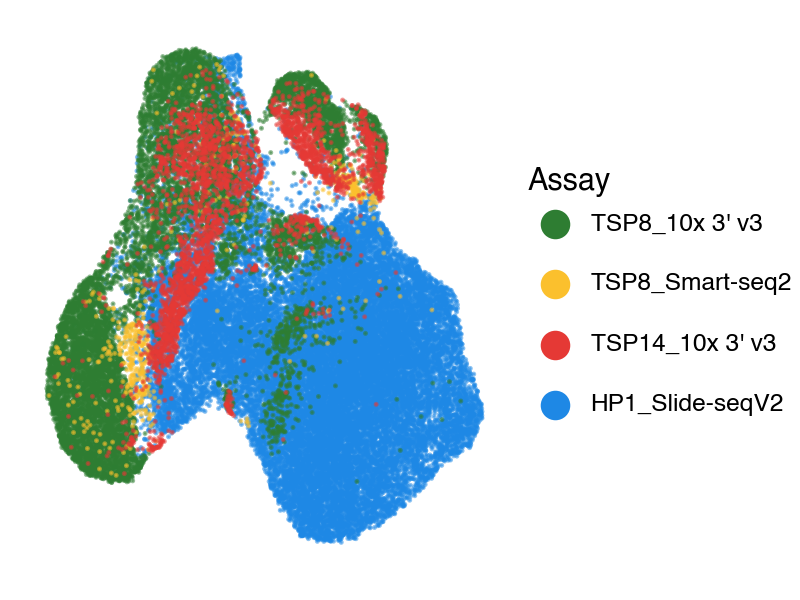

<Figure Size: (400 x 300)>

In [68]:
p = (
    ggplot(df_joint, aes(x='x2',y='y2',color='donor_assay')) + 
        geom_point(size = 0.01, alpha = 0.5) +
        labs(color = 'Assay') + 
        theme_void() + 
        scale_color_manual(values = palette_assay) + 
        guides(color = guide_legend(
            ncol=1,
            override_aes = {'size':5, 'alpha':1}
        )) + 
        theme(figure_size=(4,3))
)
p.save(fig_res_dir + 'fig6f2.pdf')
p

### ST prediction

In [69]:
df_st = st.obs.copy()
df_st['compartment_pred_scvi'] = df_st['compartment_pred_scvi'].str.capitalize()
df_st['compartment_pred_spvae'] = df_st['compartment_pred_spvae'].str.capitalize()

for l in ['cell_type_pred_scvi', 'cell_type_pred_spvae']:
    df_st[l] = df_st[l].str.capitalize()
    df_st[l] = df_st[l].str.replace(
        'Mature nk t cell', 'Mature NK T cell')
    df_st[l] = df_st[l].str.replace(
        'Cd8-positive, alpha-beta t cell', 'CD8+, alpha-beta T cell ')
    df_st[l] = df_st[l].str.replace(
        'Luminal cell of prostate epithelium', 'Epithelium luminal cell')
    df_st[l] = df_st[l].str.replace(
        'Basal cell of prostate epithelium', 'Epithelium basal cell')


In [70]:
df_st['cell_type_pred_scvi'].value_counts()

Unknown                      11434
Smooth muscle cell            8035
Epithelial cell               2938
Epithelium luminal cell       1808
Fibroblast                    1802
Club cell                      938
Macrophage                     885
Epithelium basal cell          795
Myeloid cell                   282
Endothelial cell               272
CD8+, alpha-beta T cell         49
Mature NK T cell                13
Monocyte                        11
T cell                           8
Erythroid progenitor cell        8
Name: cell_type_pred_scvi, dtype: int64

In [71]:
df_st['cell_type_pred_spvae'].value_counts()

Unknown                      11400
Smooth muscle cell            9555
Fibroblast                    3980
Epithelium luminal cell       2589
Epithelial cell                519
Epithelium basal cell          454
Endothelial cell               373
Club cell                      251
Myeloid cell                    86
Macrophage                      31
T cell                          19
Erythroid progenitor cell       14
CD8+, alpha-beta T cell          5
Monocyte                         1
Neutrophil                       1
Name: cell_type_pred_spvae, dtype: int64

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3.5 x 4 in image.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/fig6e1.pdf


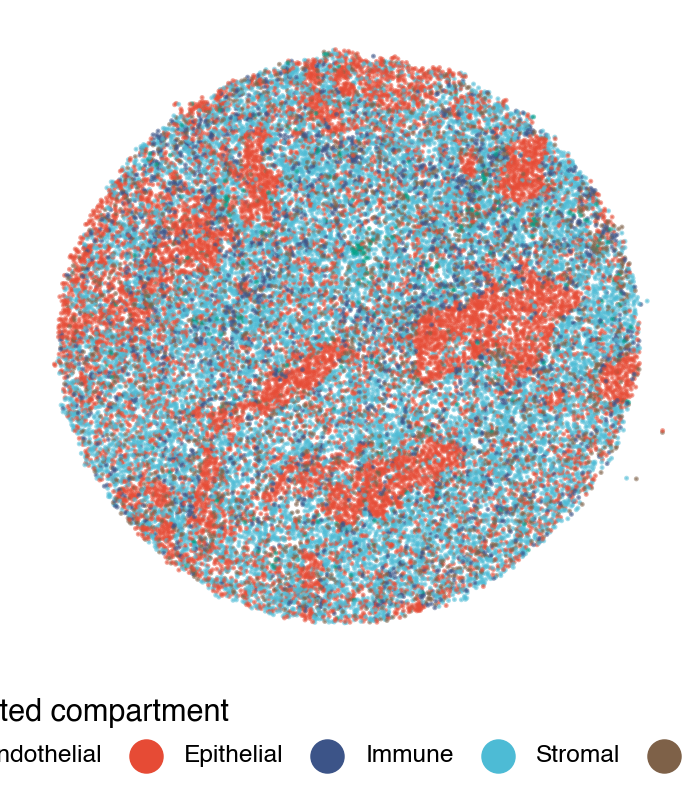

<Figure Size: (350 x 400)>

In [72]:
p = (
    ggplot(df_st, aes(x='xcoord',y='ycoord',color='compartment_pred_scvi')) + 
        geom_point(size = 0.01, alpha = 0.5) +
        labs(color = 'Predicted compartment') + 
        theme_void() + 
        scale_color_manual(palette_comp) + 
        guides(color = guide_legend(
            override_aes = {'size':6, 'alpha':1}
        )) + 
        theme(figure_size=(3.5,4), 
              legend_position='bottom')
)
p.save(fig_res_dir + 'fig6e1.pdf')
p

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 7 x 3.5 in image.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/fig6e2.pdf


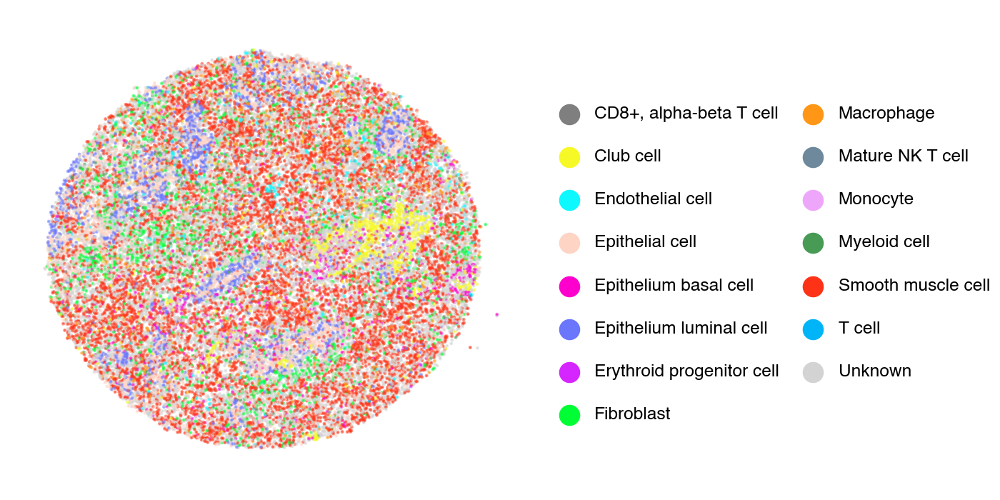

<Figure Size: (700 x 350)>

In [73]:
p = (
    ggplot(df_st, aes(x='xcoord',y='ycoord',color='cell_type_pred_scvi')) + 
        geom_point(size = 0.01, alpha = 0.5) +
        labs(color = '') + 
        theme_void() + 
        scale_color_manual(values=palette_ct) + 
        guides(color = guide_legend(
            ncol=2,
            override_aes = {'size':5, 'alpha':1}
        )) + 
        theme(figure_size=(7,3.5))
)
p.save(fig_res_dir + 'fig6e2.pdf')
p

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 3.5 x 4 in image.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/fig6g1.pdf


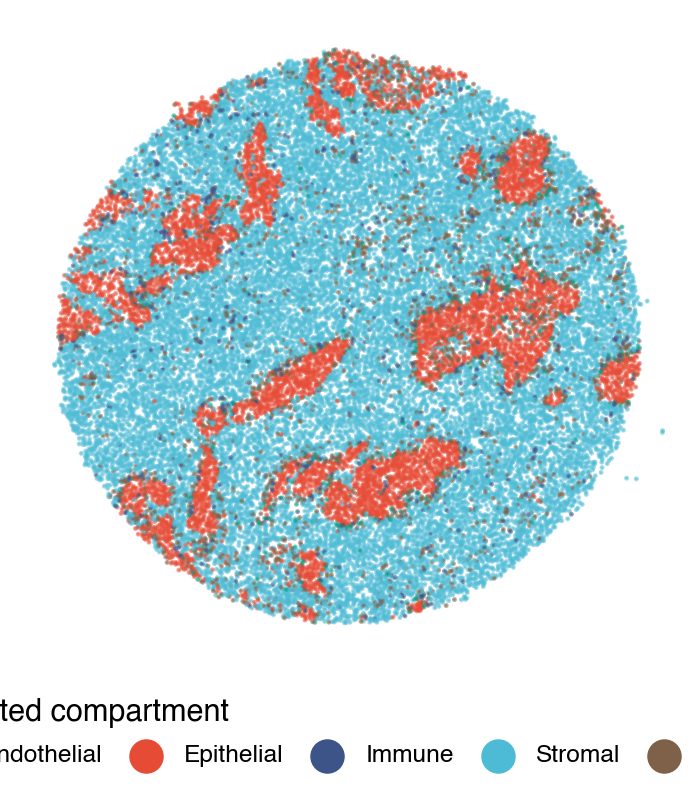

<Figure Size: (350 x 400)>

In [74]:
p = (
    ggplot(df_st, aes(x='xcoord',y='ycoord',color='compartment_pred_spvae')) + 
        geom_point(size = 0.01, alpha = 0.5) +
        labs(color = 'Predicted compartment') + 
        theme_void() + 
        scale_color_manual(palette_comp) + 
        guides(color = guide_legend(
            override_aes = {'size':6, 'alpha':1}
        )) + 
        theme(figure_size=(3.5,4), 
              legend_position='bottom')
)
p.save(fig_res_dir + 'fig6g1.pdf')
p

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 7 x 3.5 in image.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: /Users/jysumac/Projects/Smoother_paper/results/figures/prostate_ref_mapping/fig6g2.pdf


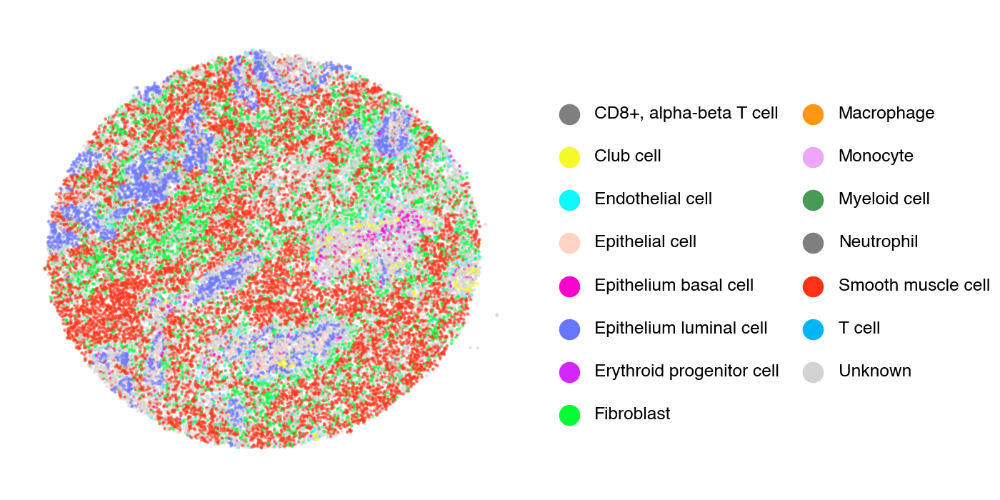

<Figure Size: (700 x 350)>

In [75]:
p = (
    ggplot(df_st, aes(x='xcoord',y='ycoord',color='cell_type_pred_spvae')) + 
        geom_point(size = 0.01, alpha = 0.5) +
        labs(color = '') + 
        theme_void() + 
        scale_color_manual(values=palette_ct) + 
        guides(color = guide_legend(
            ncol=2,
            override_aes = {'size':5, 'alpha':1}
        )) + 
        theme(figure_size=(7,3.5))
)
p.save(fig_res_dir + 'fig6g2.pdf')
p

## Check marker gene expressions

### Smooth muscle vs fibroblast

Hirz et al. labeled most of the stromal cells as fibroblast (https://www.nature.com/articles/s41467-023-36325-2#Fig1) whereas our new model predict them to be smooth muscle cells.

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/scales/scale_manual.py:45: PlotnineWarning: The palette of scale_color_manual can return a maximum of 2 values. 15 were requested from it.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/scales/scale_manual.py:45: PlotnineWarning: The palette of scale_color_manual can return a maximum of 2 values. 15 were requested from it.


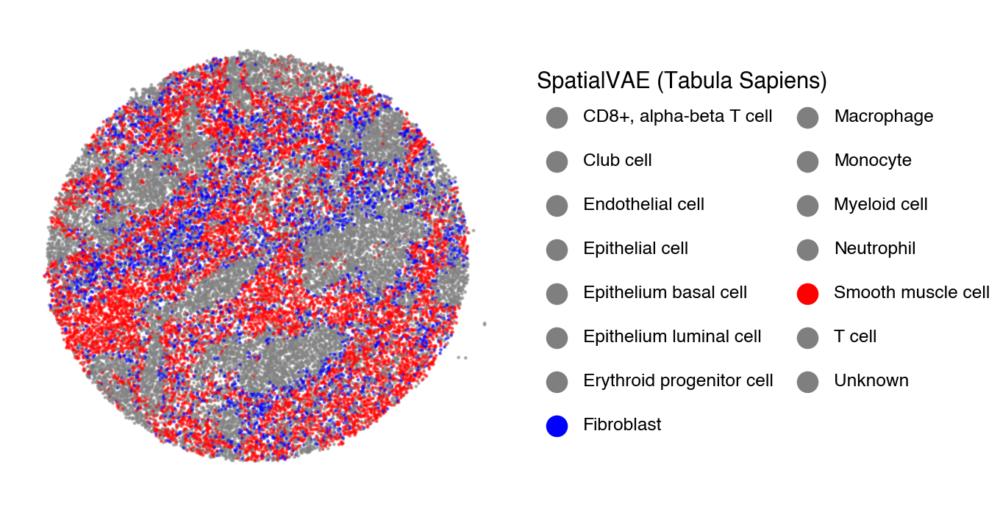

<Figure Size: (680 x 350)>

In [76]:
(
    ggplot(df_st, aes(x='xcoord',y='ycoord',color='cell_type_pred_spvae')) + 
        geom_point(size = 0.01, alpha = 0.5) +
        labs(color = 'SpatialVAE (Tabula Sapiens)') + 
        theme_void() + 
        scale_color_manual(values={'Smooth muscle cell': 'red', 'Fibroblast': 'blue'}) + 
        guides(color = guide_legend(
            ncol=2,
            override_aes = {'size':5, 'alpha':1}
        )) + 
        theme(figure_size=(6.8,3.5))
)

/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/scales/scale_manual.py:45: PlotnineWarning: The palette of scale_color_manual can return a maximum of 3 values. 17 were requested from it.
/Users/jysumac/miniforge3/envs/stagate/lib/python3.11/site-packages/plotnine/scales/scale_manual.py:45: PlotnineWarning: The palette of scale_color_manual can return a maximum of 3 values. 17 were requested from it.


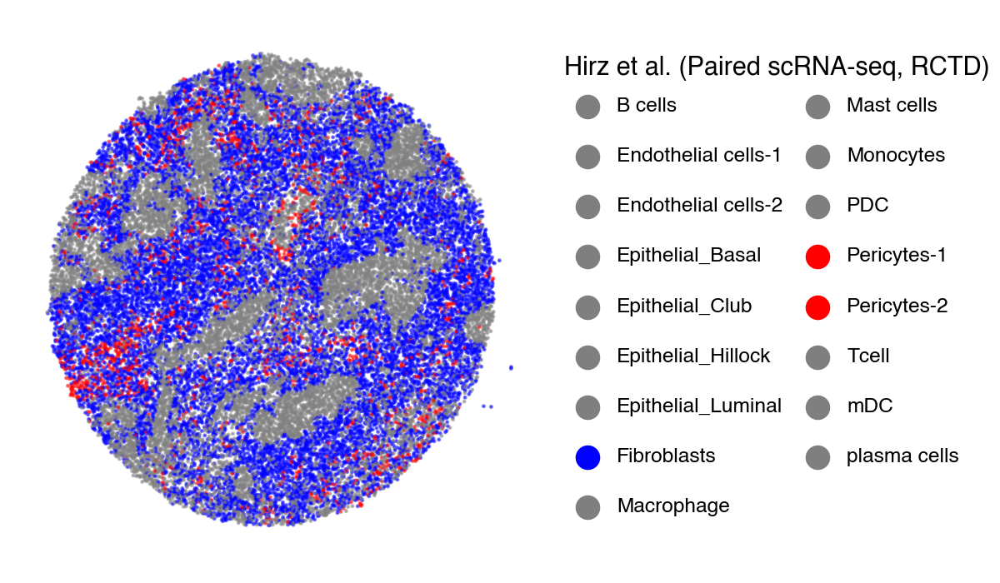

<Figure Size: (600 x 350)>

In [77]:
(
    ggplot(df_st, aes(x='xcoord',y='ycoord',color='cell2')) + 
        geom_point(size = 0.01, alpha = 0.5) +
        labs(color = 'Hirz et al. (Paired scRNA-seq, RCTD)') + 
        theme_void() + 
        scale_color_manual(values={'Pericytes-1': 'red', 'Pericytes-2': 'red', 'Fibroblasts': 'blue'}) + 
        guides(color = guide_legend(
            ncol=2,
            override_aes = {'size':5, 'alpha':1}
        )) + 
        theme(figure_size=(6,3.5))
)

### Smooth muscle marker genes

In [78]:
import warnings

musc_genes = ['ACTA2', 'RGS5', 'MT1M', # from Hirz et al.
              'MYL9', 'SORBS2', 'MYLK', 'DES', 'ACTG2']
mucs_genes = [g for g in musc_genes if g in st.var_names]

df_st_exp = df_st[['xcoord', 'ycoord', 'cell2', 'cell_type_pred_spvae']]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for g in musc_genes:
        df_st_exp[g] = np.log1p(st[:, g].layers['raw'].toarray())
        #df_st_exp[g] = st[:, g].layers['raw'].toarray()

df_st_exp = pd.melt(
    df_st_exp, 
    id_vars=['xcoord', 'ycoord', 'cell2', 'cell_type_pred_spvae'], 
    var_name='Gene', value_name='Expression'
)

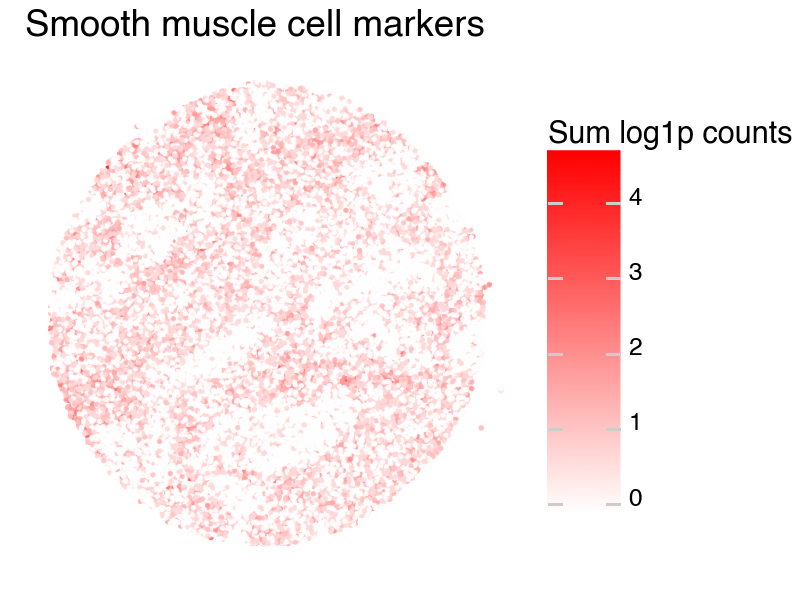

<Figure Size: (400 x 300)>

In [79]:
df_st_exp_grp = df_st_exp.groupby(['xcoord', 'ycoord']).sum('Expression')
df_st_exp_grp = df_st_exp.reset_index()
(
    ggplot(df_st_exp, aes(x='xcoord',y='ycoord',color='Expression')) + 
        geom_point(size = 0.1, alpha = 0.8) + 
        scale_color_gradient(low='white', high='red') + 
        labs(color = 'Sum log1p counts', title = f'Smooth muscle cell markers') +
        theme_void() + 
        theme(figure_size=(4,3))
)

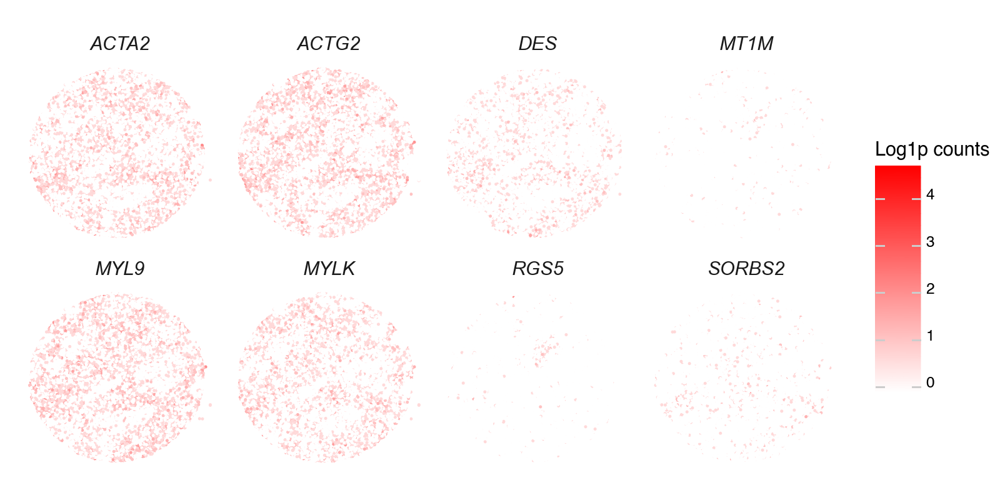

<Figure Size: (800 x 400)>

In [80]:
(
    ggplot(df_st_exp, aes(x='xcoord',y='ycoord',color='Expression')) + 
        facet_wrap('~Gene', ncol = 4) + 
        geom_point(size = 0.01, alpha = 1) +
        labs(color = 'Log1p counts') + 
        scale_color_gradient(low='white', high='red') + 
        theme_void() + 
        theme(figure_size=(8,4),
              strip_text = element_text(font = 'Arial', style = "italic"))
)

### Fibroblast marker genes

In [81]:
fibro_genes = ['DCN', 'LUM', # from Hirz et al.
               'COL1A2', 'COL3A1', 'MDK', 'ADAMTS4', 'MEG3','FHL2']

df_st_exp = df_st[['xcoord', 'ycoord', 'cell2', 'cell_type_pred_spvae']]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for g in fibro_genes:
        if g in st.var_names:
            df_st_exp[g] = np.log1p(st[:, g].layers['raw'].toarray())

df_st_exp = pd.melt(
    df_st_exp, 
    id_vars=['xcoord', 'ycoord', 'cell2', 'cell_type_pred_spvae'], 
    var_name='Gene', value_name='Expression'
)

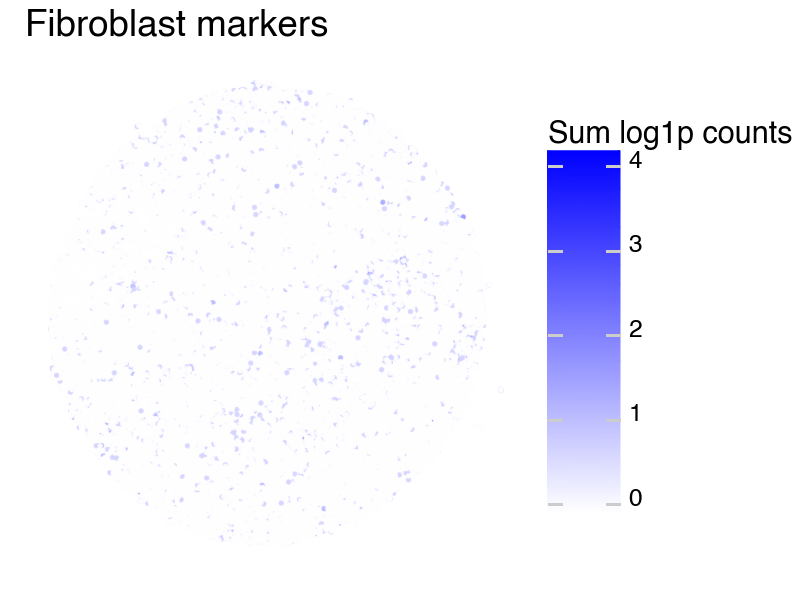

<Figure Size: (400 x 300)>

In [82]:
df_st_exp_grp = df_st_exp.groupby(['xcoord', 'ycoord']).sum('Expression')
df_st_exp_grp = df_st_exp.reset_index()
(
    ggplot(df_st_exp, aes(x='xcoord',y='ycoord',color='Expression')) + 
        geom_point(size = 0.1, alpha = 0.8) + 
        scale_color_gradient(low='white', high='blue') + 
        labs(color = 'Sum log1p counts', title = f'Fibroblast markers') +
        theme_void() + 
        theme(figure_size=(4,3))
)

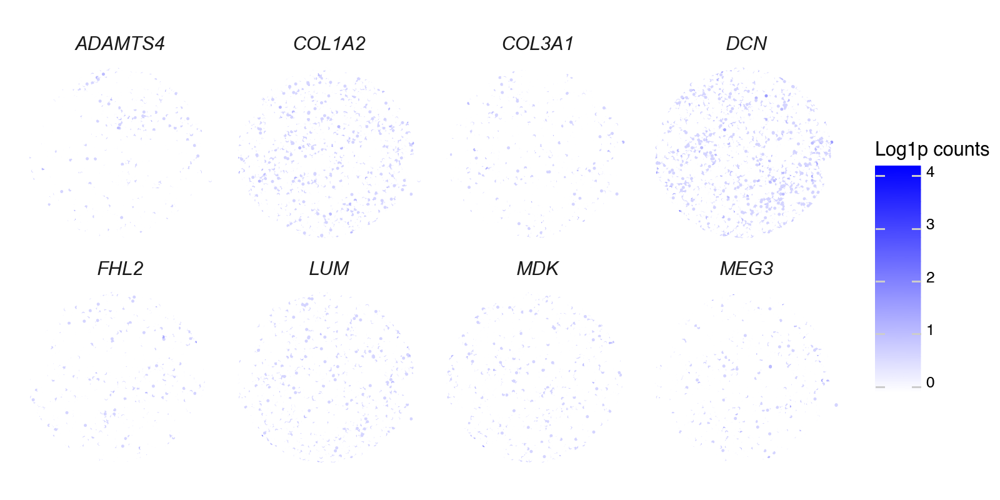

<Figure Size: (800 x 400)>

In [83]:
(
    ggplot(df_st_exp, aes(x='xcoord',y='ycoord',color='Expression')) + 
        facet_wrap('~Gene', ncol = 4) + 
        geom_point(size = 0.01, alpha = 1) +
        labs(color = 'Log1p counts') + 
        scale_color_gradient(low='white', high='blue') + 
        theme_void() + 
        theme(figure_size=(8,4),
              strip_text = element_text(font = 'Arial', style = "italic"))
)